# SpatialMouse: Mefisto factorization of xDbit data

Each section is processed individually.

## Literature/Tutorials:

- Publication: https://www.nature.com/articles/s41592-021-01343-9#data-availability
- Python tutorial: https://github.com/bioFAM/MEFISTO_tutorials/blob/master/MEFISTO_ST.ipynb
- Python tutorial using `muon`: https://muon-tutorials.readthedocs.io/en/latest/mefisto/3-MEFISTO-ST.html
- Website: https://biofam.github.io/MOFA2/MEFISTO.html

## Similar tools:
- https://github.com/willtownes/spatial-factorization-py
- https://github.com/willtownes/nsf-paper

# Run MEFISTO via script

In terminal:
`nohup python SpatialMouse_06_Mefisto.py &>mefisto.out &`

### Check output

In [59]:
!tail -n 20 mefisto.out

Optimising sigma node...
Iteration 40: time=32.44, ELBO=212842.59, deltaELBO=100.605 (0.00063810%), Factors=10
Iteration 41: time=1.84, ELBO=213174.72, deltaELBO=332.139 (0.00210663%), Factors=10
Iteration 42: time=1.82, ELBO=213271.33, deltaELBO=96.606 (0.00061273%), Factors=10
Iteration 43: time=1.84, ELBO=213362.98, deltaELBO=91.645 (0.00058127%), Factors=10
Iteration 44: time=1.85, ELBO=213449.14, deltaELBO=86.163 (0.00054650%), Factors=10
Iteration 45: time=1.83, ELBO=213527.90, deltaELBO=78.760 (0.00049954%), Factors=10
Iteration 46: time=1.82, ELBO=213598.56, deltaELBO=70.659 (0.00044816%), Factors=10

Converged!



#######################
## Training finished ##
#######################


Saving model in out/models/mofa_model_Kidney_37_46_C1.hdf5...
2022-07-22 16:24:40: Script finished after 0:30:29.679089.


In [1]:
## The following code ensures that all functions and init files are reloaded before executions.
%load_ext autoreload
%autoreload 2

In [2]:
## Import the custom library
import os
import sys

# add xDbit toolbox path to path variable
module_path = os.path.abspath("../../")
if module_path not in sys.path:
    sys.path.append(module_path)

import dbitx_funcs as db

import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from glob import glob
from pathlib import Path
import seaborn as sns

In [3]:
from mofapy2.run.entry_point import entry_point

# # import mofax from Github repo to be able to adjust plotting parameters
# module_path = os.path.abspath('/home/hpc/johannes.wirth/github/mofax/')
# if module_path not in sys.path:
#     sys.path.append(module_path)
import mofax

In [4]:
plt.rcParams['figure.dpi'] = 80
plt.style.use('default')

## Load data per organ

### Set directories

In [5]:
data_dir = "out/"
model_dir = os.path.join(data_dir, "models")

# create model path if necessary
Path(model_dir).mkdir(parents=True, exist_ok=True)

### Load models

In [6]:
#model_files = glob(os.path.join(HOME, "data/experiments/SpatialMouse/mofa_models/*.hdf5"))
model_files = sorted(glob(os.path.join(model_dir, "*.hdf5")))

In [7]:
model_files

['out/models/mofa_model_Brain_37_46_C2.hdf5',
 'out/models/mofa_model_Brain_37_46_C3.hdf5',
 'out/models/mofa_model_Heart_37_38_A3.hdf5',
 'out/models/mofa_model_Heart_37_38_B1.hdf5',
 'out/models/mofa_model_Heart_37_46_A3.hdf5',
 'out/models/mofa_model_Heart_37_46_B1.hdf5',
 'out/models/mofa_model_Kidney_37_38_B3.hdf5',
 'out/models/mofa_model_Kidney_37_38_C1.hdf5',
 'out/models/mofa_model_Kidney_37_46_B3.hdf5',
 'out/models/mofa_model_Kidney_37_46_C1.hdf5',
 'out/models/mofa_model_Liver_37_38_B2.hdf5',
 'out/models/mofa_model_Liver_37_46_B2.hdf5',
 'out/models/mofa_model_Spleen_37_38_A1.hdf5',
 'out/models/mofa_model_Spleen_37_38_A2.hdf5',
 'out/models/mofa_model_Spleen_37_46_A1.hdf5',
 'out/models/mofa_model_Spleen_37_46_A2.hdf5']

In [8]:
models = {}

for file in model_files:
    stripped = os.path.basename(file).lstrip("mofa_model_")
    organ = stripped.split("_")[0]
    idx = stripped.split(".")[-2].lstrip(organ + "_")
    
    if organ not in models.keys():
        models[organ] = {}
    
    models[organ][idx] = mofax.mofa_model(file)

## Downstream analysis

Good, more advanced tutorial in python:

1. Training: https://github.com/bioFAM/mofax/blob/master/notebooks/training_pbmc10k.ipynb
2. Downstream analysis: https://github.com/bioFAM/mofax/blob/master/notebooks/getting_started_pbmc10k.ipynb

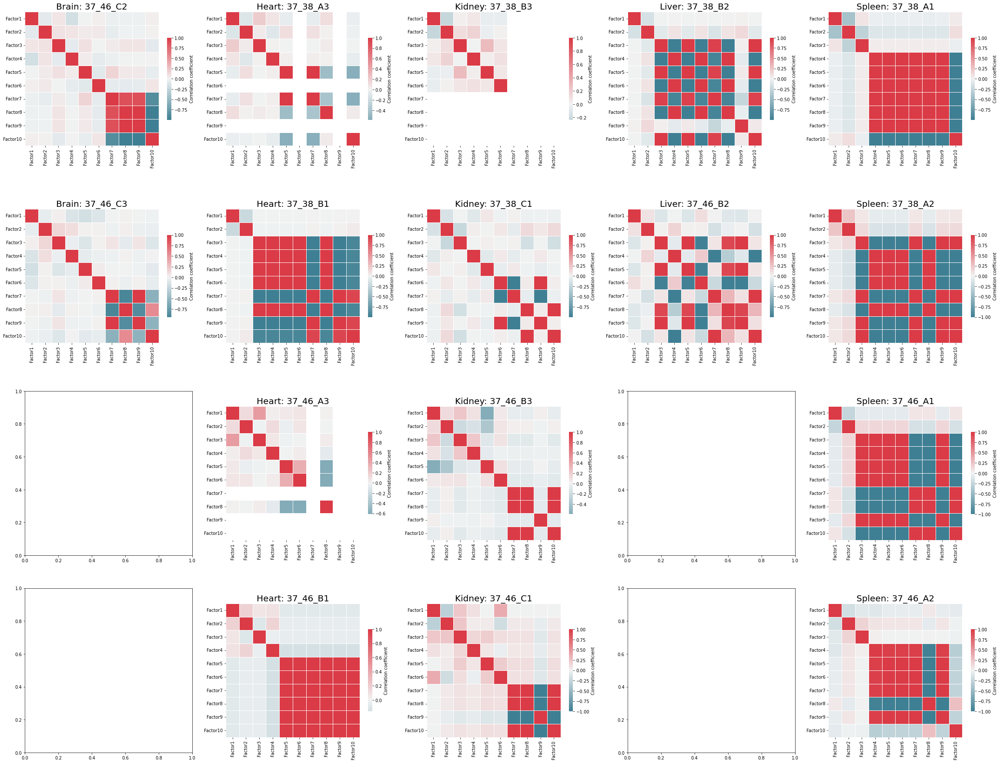

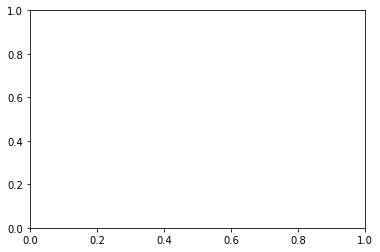

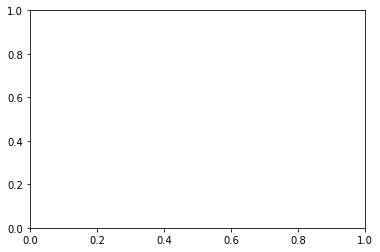

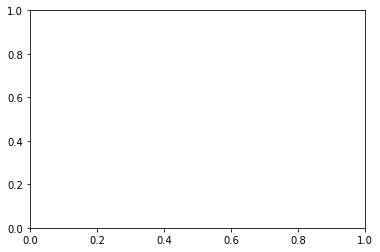

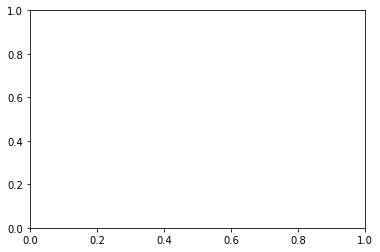

...

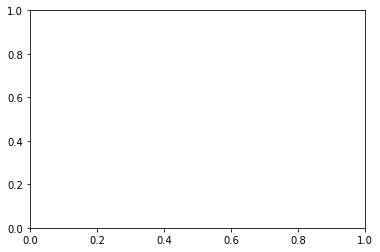

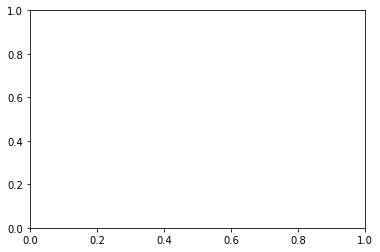

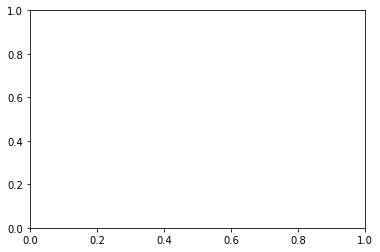

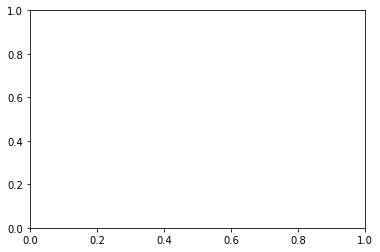

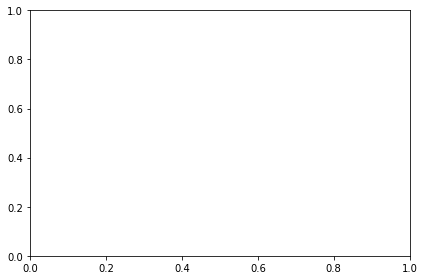

In [24]:
# get plotting parameters
organs = models.keys()
ncols = len(organs)
nrows = np.max([len(models[organ].keys()) for organ in models])

# create plot
fig, axs = plt.subplots(nrows, ncols, figsize=(8*ncols, 8*nrows))

for c, organ in enumerate(organs):
    # get indices for this organ
    indices = models[organ].keys()
    for r, idx in enumerate(indices):
        m = models[organ][idx]
        
        # plot
        p = mofax.plot_factors_correlation(m, ax=axs[r, c])
        
        # add titles
        axs[r,c].set_title("{}: {}".format(organ, idx), fontsize=20)
        
plt.tight_layout()
plt.show()

In [26]:
rdict = {}
for organ in sorted(models.keys()):
    mdict = {idx: m.get_r2().set_index('Factor')[["R2"]] for idx, m in models[organ].items()}
    rdict[organ] = pd.concat(mdict, axis=1).droplevel(1, axis=1)

In [27]:
expvar = pd.concat(rdict, axis=1).sort_index(level=0, ascending=False).drop(['Factor10', 'Factor9'], axis=0)

In [28]:
expvar

Brain                Heart                                 \
          37_46_C2   37_46_C3  37_38_A3  37_38_B1  37_46_A3   37_46_B1   
Factor                                                                   
Factor8   0.000000   0.000000  0.000000  0.000000  0.000000   0.000000   
Factor7   0.000000   0.000000  0.000000  0.000000  0.000000   0.000000   
Factor6   0.096720   1.122624  0.000000  0.000000  0.000000   0.000000   
Factor5   1.409876   1.634556  0.000000  0.000000  0.000000   0.000000   
Factor4   1.798338   3.496248  0.995463  0.000000  1.906568   1.293510   
Factor3   3.151000   4.303426  1.966935  0.000000  1.940030   1.405787   
Factor2   6.451380   5.933946  3.027040  0.763142  2.386141   4.002893   
Factor1  14.195508  14.446658  3.539175  2.315211  9.854430  10.183436   

            Kidney                                     Liver             \
          37_38_B3  37_38_C1   37_46_B3   37_46_C1  37_38_B2   37_46_B2   
Factor                                                                    
Factor8   0.000000  0.000000   0.000000   0.000000  0.000000   0.000000   
Factor7   0.000000  0.000000   0.000000   0.000000  0.000000   0.000000   
Factor6   0.657177  0.000000   0.663972   1.064020  0.000000   0.000000   
Factor5   1.536965  0.562412   1.078337   1.287377  0.000000   0.000000   
Factor4   2.322972  0.629264   2.008301   1.527935  0.000000   0.000000   
Factor3   2.445859  2.119416   5.207467   5.074298  0.000000   0.000000   
Factor2   5.865264  2.509415  13.627845   8.815795  1.328230   0.264889   
Factor1  11.004275  8.413547  14.578784  13.809890  8.140409  14.983994   

           Spleen                                  
         37_38_A1  37_38_A2   37_46_A1   37_46_A2  
Factor                                             
Factor8  0.000000  0.000000   0.000000   0.000000  
Factor7  0.000000  0.000000   0.000000   0.000000  
Factor6  0.000000  0.000000   0.000000   0.000000  
Factor5  0.000000  0.000000   0.000000   0.000000  
Factor4  0.000000  0.000000   0.000000   0.000000  
Factor3  0.875181  0.000000   0.000000   0.266981  
Factor2  3.242362  0.806165   0.748730   0.546223  
Factor1  7.815892  3.697187  19.095141  16.766948

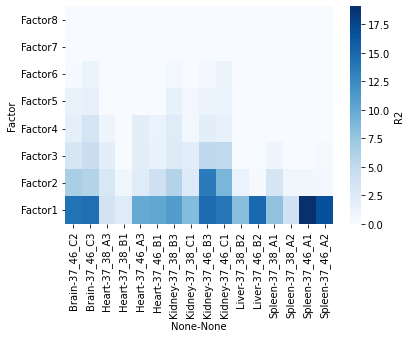

In [42]:
sns.heatmap(expvar, cmap="Blues", cbar_kws={"label": 'R2'})
plt.savefig("figures/heatmap_var_explained.pdf", bbox_inches='tight')
plt.show()

## Plot first n factors of one example section

### Read spatial data

In [32]:
input_file_pattern = "pp_wohires_deg"
input_files = [elem for elem in glob(os.path.join(data_dir, "*.h5ad")) if input_file_pattern in elem]

In [33]:
input_files

['out/Heart_adata_pp_wohires_deg.h5ad',
 'out/Spleen_adata_pp_wohires_deg.h5ad',
 'out/Brain_adata_pp_wohires_deg.h5ad',
 'out/Liver_adata_pp_wohires_deg.h5ad',
 'out/Kidney_adata_pp_wohires_deg.h5ad']

In [35]:
adatas = {os.path.basename(file).split("_")[0]: sc.read(file) for file in input_files}

In [36]:
# select section per organ
orgsec_dict = {
    "Brain": "37_46_C3",
    "Heart": "37_38_A3",
    "Kidney": "37_46_B3",
    "Liver": "37_38_B2",
    "Spleen": "37_46_A1"
}

Saving figure to file figures/spatial_factors_Brain_37_46_C3_phalloidin.pdf
Saved.


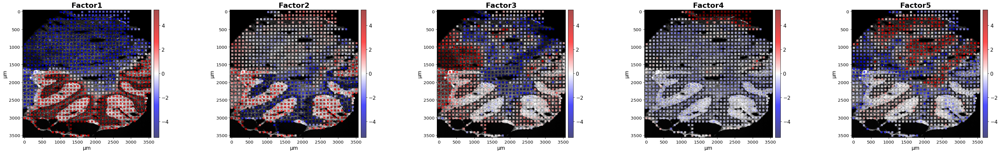

Saving figure to file figures/spatial_factors_Heart_37_38_A3_phalloidin.pdf
Saved.


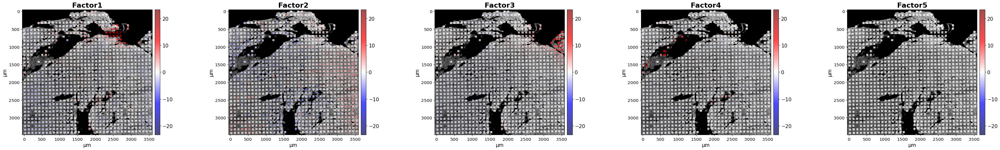

Saving figure to file figures/spatial_factors_Kidney_37_46_B3_phalloidin.pdf
Saved.


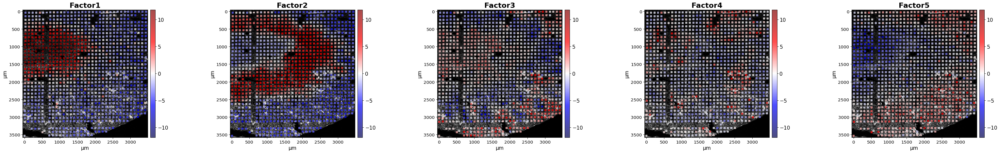

Saving figure to file figures/spatial_factors_Liver_37_38_B2_phalloidin.pdf
Saved.


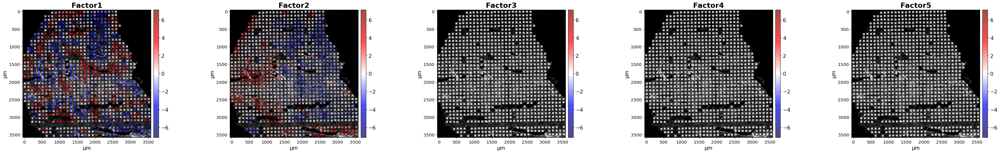

Saving figure to file figures/spatial_factors_Spleen_37_46_A1_phalloidin.pdf
Saved.


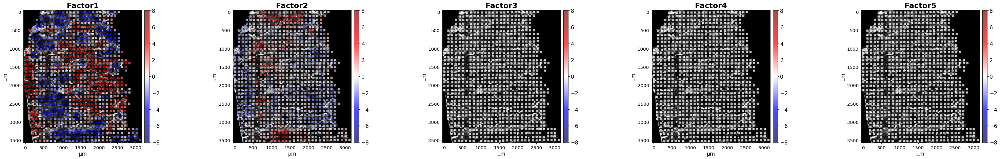

In [37]:
# parameters
groupby = "id"
n_factors = 5
image_key = "phalloidin"

# get organs sorted by alphabet
organs = sorted(orgsec_dict)
for organ in organs:
    idx = orgsec_dict[organ]
    
    # get model
    m = models[organ][idx]
    
    # get adata information
    adata = adatas[organ]
    a = db.tl.extract_groups(adata, groupby=groupby, groups=idx, extract_uns=True)

    # extract factor information and add to adata
    fact_df = m.get_factors(df=True)
    for col in fact_df.columns:
        a.obs[col] = fact_df[col]
        
    db.pl.spatial_single(a, keys=fact_df.columns[:n_factors], max_cols=n_factors, image_key=image_key,
                         cmap='seismic', cmap_center=0,
                         alpha=0.7,
                         save_only=False, savepath="figures/spatial_factors_{}_{}_{}.pdf".format(organ, idx, image_key))

# Explore results on kidney sample

To further investigate the outcome of MEFISTO we did the downstream analysis on one kidney section.

## Smoothness of factors

All of this factors seem to capture spatial patterns of variation that seems to vary smoothly along space to some extent. We can take a look at the smoothness score inferred by the model.

In [43]:
organ = "Kidney"
idx = "37_46_B3"

m = models[organ][idx]
adata = adatas[organ]

In [44]:
m

MOFA+ model: mofa model Kidney 37 46 B3
Samples (cells): 1116
Features: 2000
Groups: group1 (1116)
Views: rna (2000)
Factors: 10
Expectations: Sigma, W, Z

MEFISTO:
Covariates available: imagerow, imagecol

In [45]:
adata

AnnData object with n_obs × n_vars = 4099 × 15027
    obs: 'array_row', 'array_col', 'um_row', 'um_col', 'id', 'pixel_row', 'pixel_col', 'dapi_mean', 'dapi_mean_norm', 'experiment_id', 'organism', 'age', 'organ', 'age_months', 'mouse_id', 'exp_date', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CT010467.1_pct', 'leiden_uncorrected', 'leiden', 'leiden_coarse'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'deg_leiden', 'deg_leiden_coarse', 'experiment_id_colors', 'hvg', 'id_colors', 'leiden', 'leiden_coarse_colors', 'leiden_colors', 'log1p', 'matchedVis', 'neighbors', 'neighbors_uncorrected', 'organ_colors', 'pca', 'registered', 'spatial', 'tsne', 'umap'
    obsm: 'X_emb', 'X_pca', 'X_scanorama', 'X_tsne', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'norm_counts'
    obsp

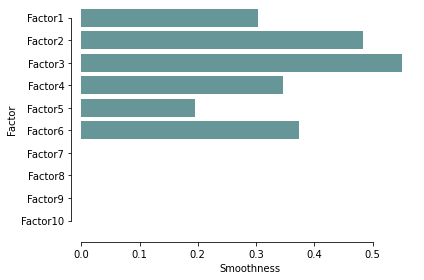

In [46]:
mofax.plot_smoothness(m)
plt.savefig("./figures/smoothness_kidney.pdf")
plt.show()

## Weights
### Get top features per Factor

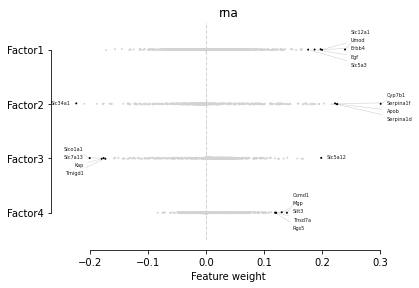

In [47]:
n_features = 5
n_factors  = 4

mofax.plot_weights(m, factors=list(range(4)), n_features=n_features)
plt.savefig("figures/factor_weights_factors{}_features{}.pdf".format(n_factors, n_features), bbox_inches="tight")
plt.show()

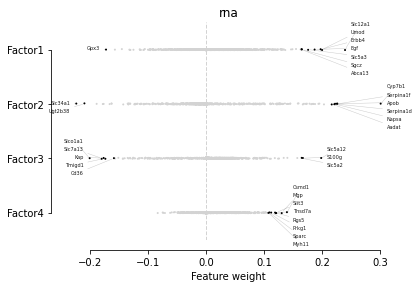

In [48]:
n_features = 8
n_factors  = 4

mofax.plot_weights(m, factors=list(range(4)), n_features=n_features)
plt.savefig("figures/factor_weights_factors{}_features{}.pdf".format(n_factors, n_features), bbox_inches="tight")
plt.show()

### Plot top features (absolute values)

Saving figure to file figures/spatial_top4_genes_positive_Factor1.pdf
Saved.


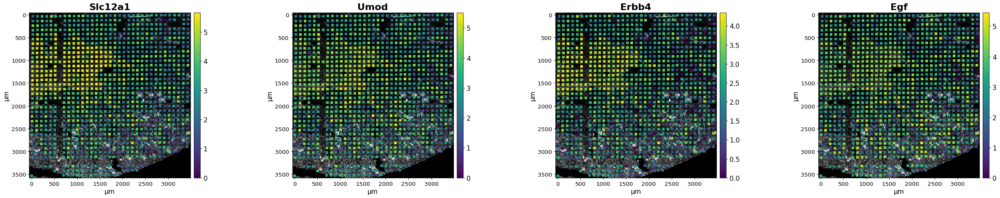

Saving figure to file figures/spatial_top4_genes_positive_Factor2.pdf
Saved.


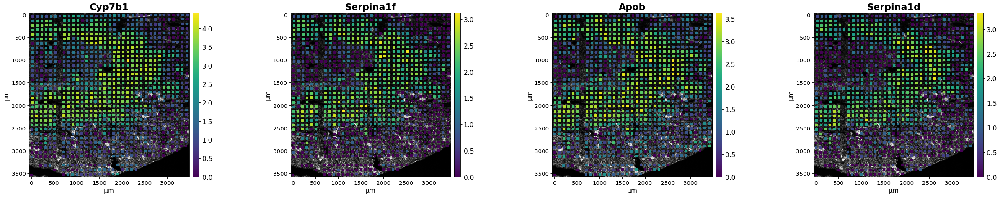

Saving figure to file figures/spatial_top4_genes_positive_Factor3.pdf
Saved.


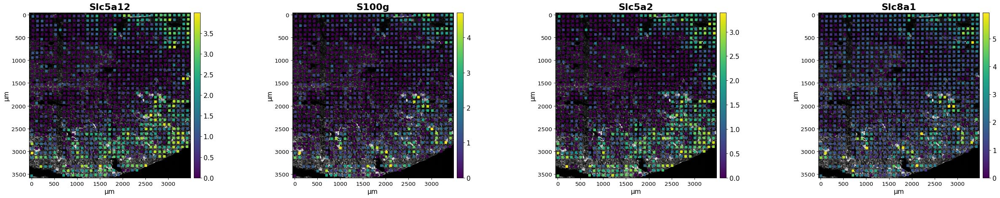

Saving figure to file figures/spatial_top4_genes_positive_Factor4.pdf
Saved.


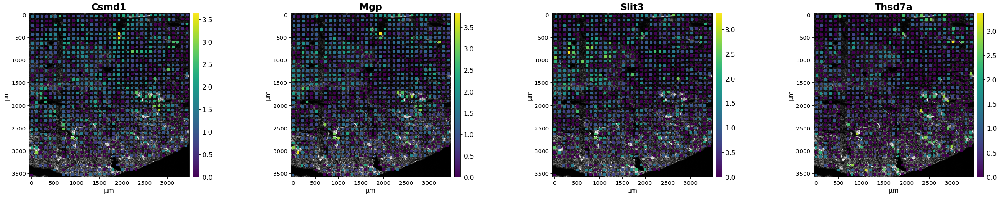

Saving figure to file figures/spatial_top4_genes_positive_Factor5.pdf
Saved.


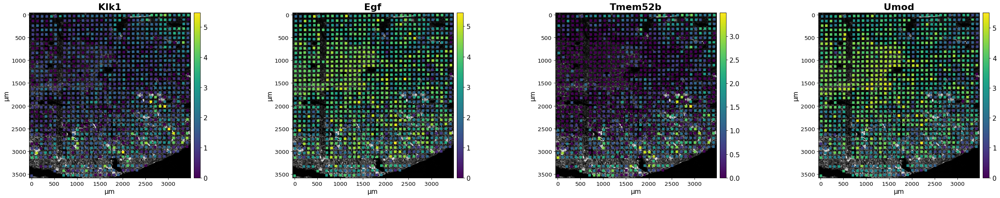

In [49]:
n_features = 4
for f in range(5):
    db.pl.spatial(adata, keys=m.get_top_features(factors=f, n_features=n_features, only_positive=True),
        image_key='phalloidin',
        groupby="id", groups=idx, savepath="figures/spatial_top{}_genes_positive_Factor{}.pdf".format(n_features, f+1))

### Plot top features (only positive values)

Saving figure to file figures/spatial_top4_genes_positive_Factor1.pdf
Saved.


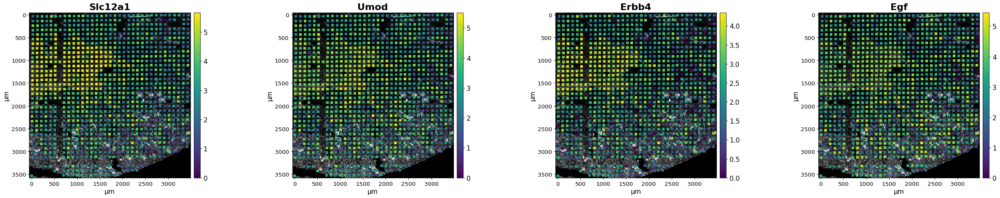

Saving figure to file figures/spatial_top4_genes_positive_Factor2.pdf
Saved.


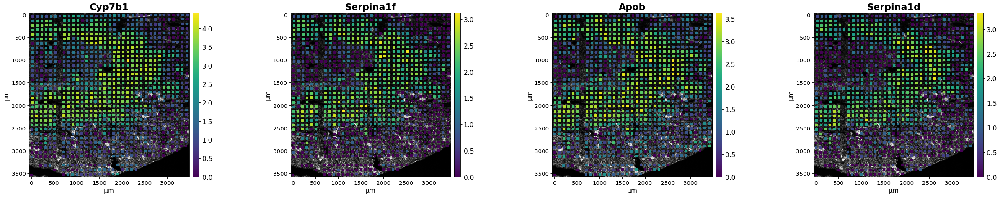

Saving figure to file figures/spatial_top4_genes_positive_Factor3.pdf
Saved.


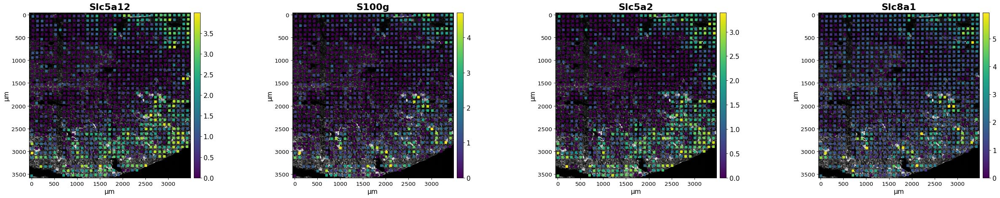

Saving figure to file figures/spatial_top4_genes_positive_Factor4.pdf
Saved.


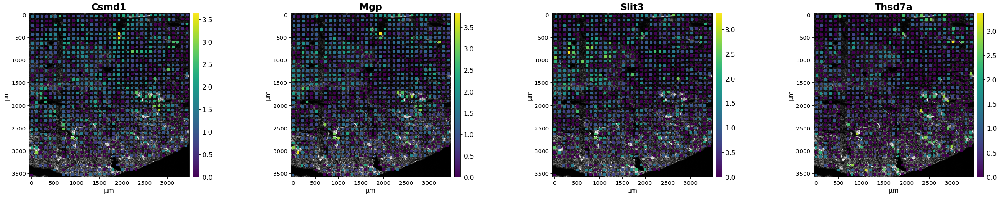

Saving figure to file figures/spatial_top4_genes_positive_Factor5.pdf
Saved.


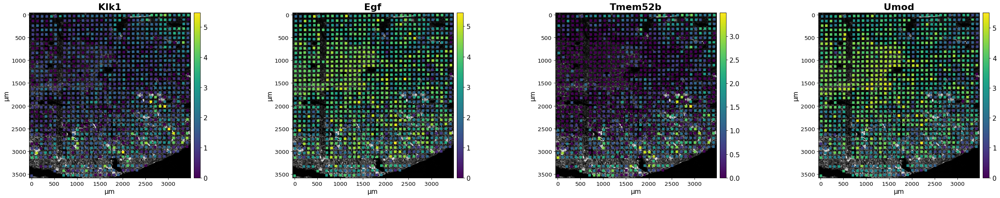

In [50]:
n_features = 4
for f in range(5):
    db.pl.spatial(adata, keys=m.get_top_features(factors=f, n_features=n_features, only_positive=True),
        image_key='phalloidin',
        groupby="id", groups=idx, savepath="figures/spatial_top{}_genes_positive_Factor{}.pdf".format(n_features, f+1))

# GO term analysis with top weighted genes per factor

## How to select top weighted genes?

Calculate 95 % confidence intervals of weights and select genes that are > 95% CI

In [51]:
from scipy import stats
from gprofiler import GProfiler

In [52]:
weights = pd.DataFrame(m.get_weights(), index=m.get_features()["feature"].values)

In [53]:
gos = {
    "gprofiler": {},
    "stringdb": {}
}

for i in weights.columns[:4]:
    # select weights for this factor
    w = weights[i]

    #create 95% confidence interval for weights
    cis = stats.norm.interval(alpha=0.95, loc=np.mean(w), scale=w.std())

    # select genes based on CI
    querygenes = list(w[w > cis[1]].index)

    # GO term analysis with StringDB
    sdb = db.tl.StringDB()
    e = sdb.call_stringdb_enrichment(genes=querygenes, species='mmusculus')

    # collect enrichment
    gos['stringdb']["Factor{}".format(i+1)] = e

    # GO term analysis with gprofiler
    gp = GProfiler(return_dataframe=True)
    e = gp.profile(organism='mmusculus', query=querygenes, no_evidences=False)
    # calc -log(p_value)
    e['Enrichment score'] = [-np.log10(elem) for elem in e.p_value]

    # collect enrichment
    gos['gprofiler']["Factor{}".format(i+1)] = e

for cat, e in gos.items():
    gos[cat] = pd.concat(e)

Saving figure to file figures/go_dotplot_mefistofactors_gprofiler_GO:BP.pdf
Saved.


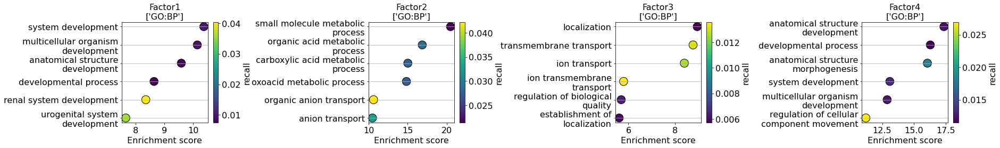

Saving figure to file figures/go_dotplot_mefistofactors_gprofiler_GO:MF.pdf
Saved.


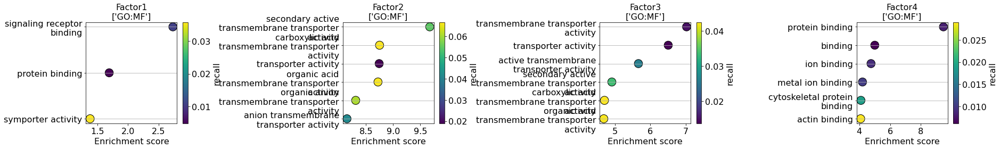

Saving figure to file figures/go_dotplot_mefistofactors_gprofiler_KEGG.pdf
Saved.


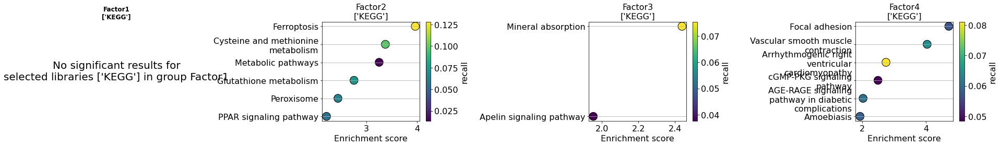

In [54]:
tool = "gprofiler"
libraries = ['GO:BP', 'GO:MF', 'KEGG']

for lib in libraries:
    db.pl.go_dotplot(gos[tool], libraries=lib, max_to_plot=6, color_key='recall', max_cols=4, figsize=(6.5,4),
        savepath="figures/go_dotplot_mefistofactors_{}_{}.pdf".format(tool, lib))

In [55]:
gos["stringdb"].source.unique()

array(['COMPARTMENTS', 'Process', 'Component', 'TISSUES', 'Keyword',
       'PMID', 'WikiPathways', 'MPO', 'NetworkNeighborAL', 'Function',
       'KEGG', 'InterPro', 'Pfam', 'RCTM', 'SMART'], dtype=object)

Saving figure to file figures/go_dotplot_mefistofactors_stringdb_Process.pdf
Saved.


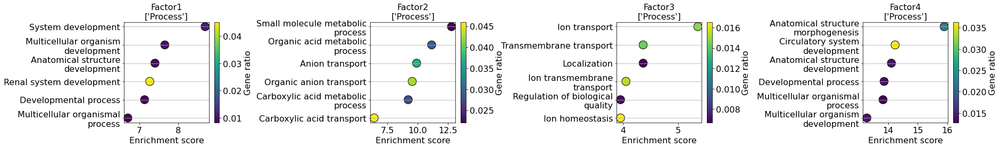

Saving figure to file figures/go_dotplot_mefistofactors_stringdb_TISSUES.pdf
Saved.


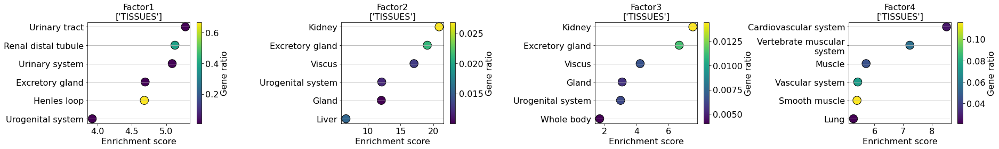

Saving figure to file figures/go_dotplot_mefistofactors_stringdb_KEGG.pdf
Saved.


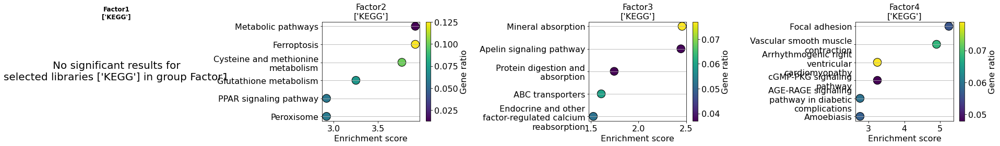

In [56]:
tool = "stringdb"
libraries = ['Process', 'TISSUES', 'KEGG']

for lib in libraries:
    db.pl.go_dotplot(gos[tool], libraries=lib, max_to_plot=6, color_key='Gene ratio', max_cols=4, figsize=(6.5,4),
        savepath="figures/go_dotplot_mefistofactors_{}_{}.pdf".format(tool, lib))